# In this Notebook:

1.Importing libraries
2. Importing data
3. Make a bar chart visualising whcih days are most popular
4. Make a histogram to visualise price distribution
5. Create a random sample of the data
6. Make a line chart showing the relationship between sales and days of the week using the sample
7. Make a histogram to visualise sales distributed over hours of the day
8. Make a bar chart that visualises the ordering frequency of customers by loyalty flag
9. Make a line chart that visualises the relationship between prices and orders made at different times of the day
10. Exploratory analysis of customer demographics using a line chart
11. Make a scatterplot exploring the relationship between age and spending power

# 1. Importing libraries

In [1]:
#Importing libraries
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

# 2. Importing data

In [2]:
#creating path to Instacart folder
path = r"/Users/katerinapilota/Desktop/Desktop - Pilot's Mac mini/dataimmersion/python/ 02:03:21 Instacart Basket Analysis"

In [3]:
#importing final merged dataset from 4.9 part 1
df_final = pd.read_pickle(os.path.join(path, '02 Data', 'Prepared Data', 'final_combined_4'))

In [4]:
#checking head of final df
df_final.head()

,order_id,user_id,order_number,orders_days_of_the_week,time_of_order_24hr_time,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,...,freq_flag,First_Name,Last_Name,Gender,STATE,Age,date_joined,n_dependants,fam_status,income
0,2539329,1,1,2,8,0.0,196,1,0,Soda,...,Regular customer,Linda,Nguyen,Female,Alabama,31,2/17/2019,3,married,40423
1,2398795,1,2,3,7,15.0,196,1,1,Soda,...,Regular customer,Linda,Nguyen,Female,Alabama,31,2/17/2019,3,married,40423
2,473747,1,3,3,12,21.0,196,1,1,Soda,...,Regular customer,Linda,Nguyen,Female,Alabama,31,2/17/2019,3,married,40423
3,2254736,1,4,4,7,29.0,196,1,1,Soda,...,Regular customer,Linda,Nguyen,Female,Alabama,31,2/17/2019,3,married,40423
4,431534,1,5,4,15,28.0,196,1,1,Soda,...,Regular customer,Linda,Nguyen,Female,Alabama,31,2/17/2019,3,married,40423


In [5]:
#checking columns of df
df_final.columns

Index(['order_id', 'user_id', 'order_number', 'orders_days_of_the_week',
       'time_of_order_24hr_time', 'days_since_prior_order', 'product_id',
       'add_to_cart_order', 'reordered', 'product_name', 'aisle_id',
       'department_id', 'prices', 'price_range_loc', 'Busiest day',
       'Two busiest days', 'busiest_period_day', 'max_order', 'loyalty_flag',
       'mean_spend', 'spend_flag', 'median_ordering', 'freq_flag',
       'First_Name', 'Last_Name', 'Gender', 'STATE', 'Age', 'date_joined',
       'n_dependants', 'fam_status', 'income'],
      dtype='object')

# 3. Make a bar chart to visualise which days are most popular

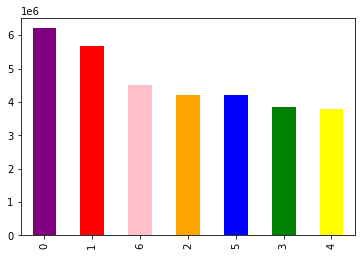

In [9]:
#making a bar chart from 'orders_days_of_the_week'
bar = df_final['orders_days_of_the_week'].value_counts(dropna = False).plot.bar(color =['purple', 'red', 'pink', 'orange', 'blue', 'green', 'yellow'])

In [10]:
#save the bar chart as a .png
bar.figure.savefig(os.path.join(path, '04 Analysis','Visualisations', 'bar_orders_dow.png'))

# 4. Make a histogram to visualise price distribution

<AxesSubplot:ylabel='Frequency'>

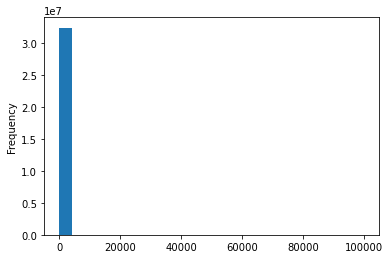

In [11]:
#making histogram
df_final['prices'].plot.hist(bins = 25)

The strange histogram result implies the prices column includes some outliers that should be addressed, or some other data inaccuracies. I will use visualisation to explore further.

<AxesSubplot:xlabel='prices', ylabel='prices'>

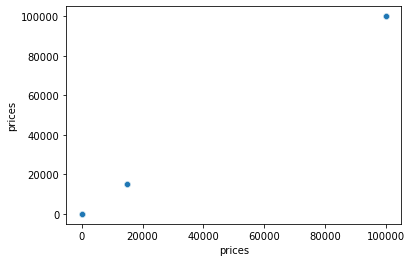

In [13]:
#creating a scatterplot
sns.scatterplot(x = 'prices', y = 'prices',data = df_final) #it appears the histogram is skewed by outliers

In [17]:
#view all not truncated result
pd.set_option('display.max_columns', None)
#view all not truncated result
pd.set_option('display.max_rows', None)

In [18]:
#checking for outliers in the prices column
df_final.loc[df_final['prices'] > 100] #there are some prices listed as $14900, which is surely a mistake

,order_id,user_id,order_number,orders_days_of_the_week,time_of_order_24hr_time,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,prices,price_range_loc,Busiest day,Two busiest days,busiest_period_day,max_order,loyalty_flag,mean_spend,spend_flag,median_ordering,freq_flag,First_Name,Last_Name,Gender,STATE,Age,date_joined,n_dependants,fam_status,income
7805,1435153,1519,26,2,11,6.0,21553,15,0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,47,Loyal customer,50.932895,High spender,6.0,Frequent customer,Craig,Clark,Male,Rhode Island,68,3/4/2020,0,divorced/widowed,177864
7806,1066435,1519,32,3,10,5.0,21553,28,1,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Two least busy days,Most orders,47,Loyal customer,50.932895,High spender,6.0,Frequent customer,Craig,Clark,Male,Rhode Island,68,3/4/2020,0,divorced/widowed,177864
15143,1697208,2409,33,1,19,5.0,21553,1,0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Two busiest days,Average orders,48,Loyal customer,35.233761,High spender,5.0,Frequent customer,Nicole,Odonnell,Female,Hawaii,55,11/11/2018,2,married,230074
20264,965345,3531,27,2,19,8.0,33664,2,0,2 % Reduced Fat Milk,84,16,99999.0,High-range product,Regularly busy,Regularly busy,Average orders,29,Regular customer,267.469870,High spender,8.0,Frequent customer,Alice,Compton,Female,Hawaii,80,10/6/2019,2,married,233776
20497,2943740,3793,1,2,9,0.0,21553,3,0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,18,Regular customer,71.191102,High spender,4.0,Frequent customer,Jerry,Allen,Male,Louisiana,59,8/23/2019,3,married,182933
22488,172425,3819,3,1,12,30.0,21553,14,0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Two busiest days,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Gregory,Cabrera,Male,Utah,69,1/26/2020,2,married,129749
22489,1578338,3819,6,2,13,30.0,21553,7,1,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Gregory,Cabrera,Male,Utah,69,1/26/2020,2,married,129749
22490,1197681,3819,7,5,15,24.0,21553,8,1,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Gregory,Cabrera,Male,Utah,69,1/26/2020,2,married,129749
22491,2216737,3819,10,5,16,10.0,21553,6,1,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Regularly busy,Most orders,10,New customer,382.493711,High spender,14.0,Regular customer,Gregory,Cabrera,Male,Utah,69,1/26/2020,2,married,129749
30434,948005,5218,2,1,0,15.0,21553,5,0,Lowfat 2% Milkfat Cottage Cheese,108,16,14900.0,High-range product,Regularly busy,Two busiest days,Fewest orders,19,Regular customer,395.505652,High spender,11.0,Regular customer,Linda,Ali,Female,Iowa,29,5/23/2017,2,married,120566


In [19]:
#checking number of outliers using a subset
outliers = df_final.loc[df_final['prices'] > 100]

In [21]:
outliers.shape

(5127, 32)

In [22]:
#checking main df
df_final.shape

(32404859, 32)

I will drop these outliers as the number of tuples is too few to greatly impact the analysis and without being able to check, a grocery store with products costing $14900 seems a likely error. 

In [24]:
#Turning outliers into NaNs
df_final.loc[df_final['prices'] >100, 'prices'] = np.nan

In [25]:
#checking the max value
df_final['prices'].max()

25.0

<AxesSubplot:ylabel='Frequency'>

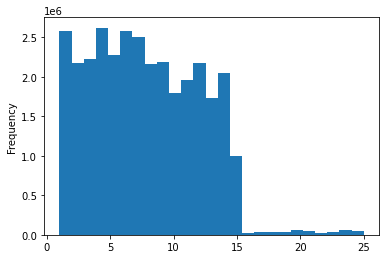

In [26]:
#retrying the historgram after data cleaning
df_final['prices'].plot.hist(bins = 25)

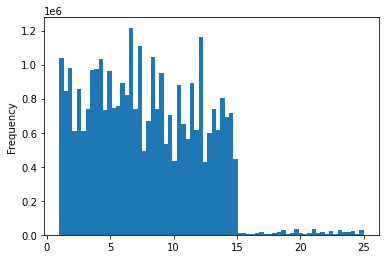

In [28]:
#assigning the histogram and increasing the number of bins
hist = df_final['prices'].plot.hist(bins = 70)

In [29]:
#saving the histogram
hist.figure.savefig(os.path.join(path, '04 Analysis','Visualisations', 'hist_orders_dow.png'))

# 5. Create a sample of the df

In [30]:
#split the data randomly into two groups: 70/30 split
#first, set the seed, a random reproducible pattern
np.random.seed(4)

In [31]:
#create a new list called dev that will store than boolean values
dev = np.random.rand(len(df_final)) <= 0.7

In [32]:
#store 70% of the sample in the dataframe big
big = df_final[dev]

In [33]:
#store 30% of the sample in the dataframe small
small = df_final[~dev]

In [34]:
#testing the sizes of the two samples
len(df_final)

32404859

In [35]:
len(big) + len(small)

32404859

# 6. Make a line chart showing the relationship between days of the week and prices using the sample

In [37]:
df_2 = small[['orders_days_of_the_week', 'prices']]

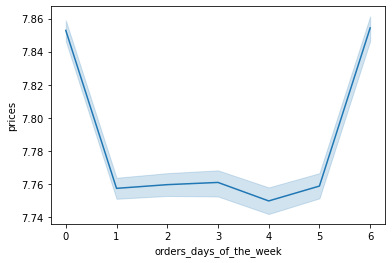

In [38]:
#create a line chart with the sample
line = sns.lineplot(data = df_2, x = 'orders_days_of_the_week', y = 'prices')

In [30]:
#saving the line chart
line.figure.savefig(os.path.join(path, '04 Analysis','Visualisations', 'line_dow.png'))

# 7. Create a histogram to visualise sales distributed by hours of the day

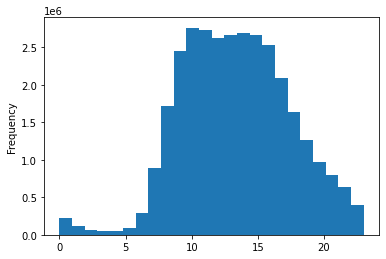

In [39]:
#make histogram
hist_hours = df_final['time_of_order_24hr_time'].plot.hist(bins = 24)

In [40]:
#save hist_hours
hist_hours.figure.savefig(os.path.join(path, '04 Analysis','Visualisations', 'hist_hours.png'))

You can clearly see from the histogram that there are fewer orders in the very early hours, with orders increasing sharply at about 10am. 10-3pm is the peak time period for ordering.

# 8. Make a bar chart that visualises the ordering frequency of customers by loyalty flag

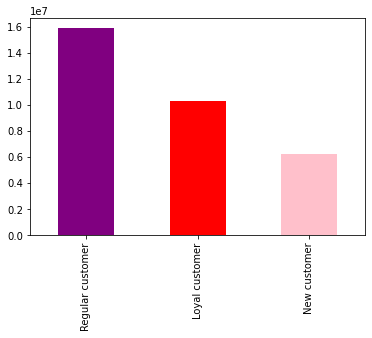

In [37]:
#create a bar chart from the 'loyalty_flag' column
loyalty_bar = df_final['loyalty_flag'].value_counts().plot.bar(color =['purple', 'red', 'pink', 'orange', 'yellow', 'green', 'blue'])

In [41]:
#save loaylty_bar
loyalty_bar.figure.savefig(os.path.join(path, '04 Analysis','Visualisations', 'loyalty_bar.png'))

# 9. Make a line chart that visualises the relationship between prices and orders made at different times of the day

In [41]:
#create a smaller df using a sample of the bigger df
df_3 = small[['time_of_order_24hr_time', 'prices']]

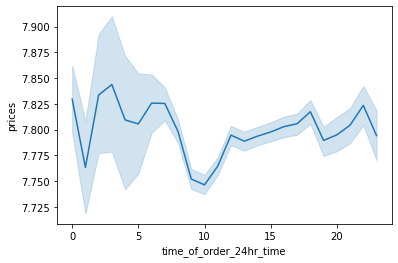

In [42]:
#create a line chart
line_hours = sns.lineplot(data = df_3, x = 'time_of_order_24hr_time', y = 'prices')

In [43]:
#save line_hours
line_hours.figure.savefig(os.path.join(path, '04 Analysis','Visualisations', 'line_hours.png'))

You can clearly see that, although the order volume increases during the middle of the day, the price of orders purchased is much high in the morning.

# 10. Exploratory analysis of customer demographics using a line chart

In [44]:
#create a df using a sample of the data
df_4 = small[['Age', 'fam_status']]

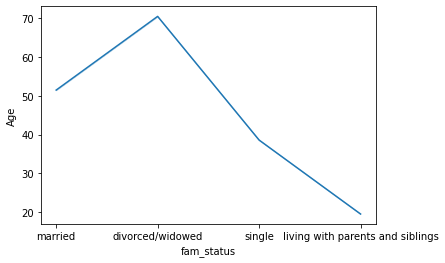

In [45]:
#create the line chart
line_age_fam = sns.lineplot(data = df_4, x = 'fam_status', y = 'Age')

In [46]:
#saving the line_age_fam line chart
line_age_fam.figure.savefig(os.path.join(path, '04 Analysis','Visualisations', 'line_age_fam.png'))

The line chart shows that customers who are in their 20s are more likely to be living with parents, those in their 30s are more likely to be single, those in their 60s and 70s are more likely to be divorced /widowed, and those their 50s age group are most likely to be married.

# 11. Make a scatterplot exploring the relationship between age and spending power

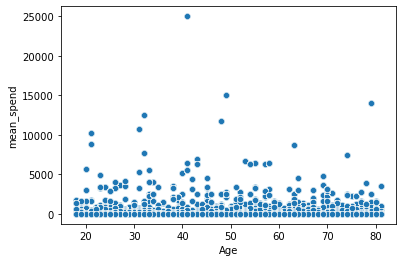

In [47]:
#creating a scatterplot
scatter_age_spend = sns.scatterplot(x = 'Age', y = 'mean_spend',data = df_final)

This scatterplot shows a normal distribution and no strong relationship between age and the average amount each customer spends

In [48]:
#saving the scaterrplot
scatter_age_spend.figure.savefig(os.path.join(path, '04 Analysis','Visualisations', 'scatter_age_spend.png'))

End.